In [1]:
!git clone https://github.com/marina-shesha/ddpm_hw_clean.git

Cloning into 'ddpm_hw_clean'...
remote: Enumerating objects: 171, done.
remote: Counting objects: 100% (171/171), done.
remote: Compressing objects: 100% (118/118), done.
remote: Total 171 (delta 95), reused 126 (delta 50), pack-reused 0
Receiving objects: 100% (171/171), 24.50 MiB | 19.57 MiB/s, done.
Resolving deltas: 100% (95/95), done.


In [2]:
%cd ddpm_hw_clean

/content/ddpm_hw_clean


In [3]:
!git pull

Already up to date.


In [4]:
!pip install wandb
!pip install ml_collections

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 27.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.8/198.8 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.2 MB/s eta 0:00:00
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8807 sha256=4760f627ff7491cfc650fa5f81df8314fb87b91c96baf4263b9be929a13b32e1
  Stored in directory: /root/.cache/pip/wheels/b7/0a/67/ada2a22079218c75a88361c0782855cc72aebc4d18d0289d05
Successfully built pathtools
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ml_colle

In [5]:
import torch
import wandb
import torchvision

import numpy as np

from data_generator import DataGenerator
from default_mnist_config import create_default_mnist_config
from diffusion import DiffusionRunner
from models.classifier import ResNet, ResidualBlock, ConditionalResNet

from matplotlib import pyplot as plt

import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '3'

In [6]:
device = torch.device('cuda')
classifier_args = {
    "block": ResidualBlock,
    "layers": [2, 2, 2, 2]
}
noisy_classifier = ConditionalResNet(**classifier_args)
noisy_classifier.to(device)

noisy_classifier.load_state_dict(torch.load('./ddpm_checkpoints/classifier.pth'))

clean_classifier = ResNet(**classifier_args)
clean_classifier.to(device)

clean_classifier.load_state_dict(torch.load('./ddpm_checkpoints/clean_classifier.pth'))

<All keys matched successfully>

#### Создайте два семплемера картинок, безусловный и условный с методом .set_classifier

In [7]:
noisy_classifier.eval();
clean_classifier.eval();

conditional_diffusion = DiffusionRunner(create_default_mnist_config(), eval=True)
conditional_diffusion.set_classifier(noisy_classifier, T=1.)

unconditional_diffusion = DiffusionRunner(create_default_mnist_config(), eval=True)


conditional_diffusion.model.eval();
unconditional_diffusion.model.eval();


In [8]:
def get_pred_labels(images_normed: torch.Tensor):
    """
    predict labels for normed images 
    [-1, 1]
    """
    images_normed = images_normed.to(device)
    with torch.no_grad():
        logits = clean_classifier(images_normed)
        pred = logits.argmax(dim = -1)
    return pred
    

def calc_acc_clean_classifier(images_normed: torch.Tensor, labels: torch.Tensor):
    """
    calculate accuracy using clean classifier
    """
    
    labels = labels.to(device)
    pred = get_pred_labels(images_normed)
    acc = (pred == labels).sum()
    return acc / images_normed.shape[0]


def sample_images(diff_process, labels=None):
    images_tensor = diff_process.sample_images(batch_size=100, labels=labels)
    images_cpu = images_tensor.cpu()
    grid = torchvision.utils.make_grid(images_cpu, nrow=10).permute(1, 2, 0)
    grid = grid.data.numpy().astype(np.uint8)

    plt.imshow(grid)
    plt.show()
    return images_tensor


def cond_print_and_calc_acc(class_num: int):
    labels = class_num*torch.ones(100).long().to(device)
    images_tensor = sample_images(conditional_diffusion, labels)
    acc = calc_acc_clean_classifier((images_tensor - 127.5)/ 127.5, labels=labels)
    print('Accuracy: ', acc.item())
    return images_tensor

noisy_classifier T = 10


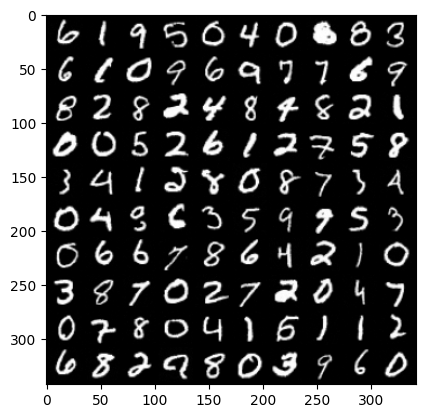

Accuracy:  0.14999999105930328


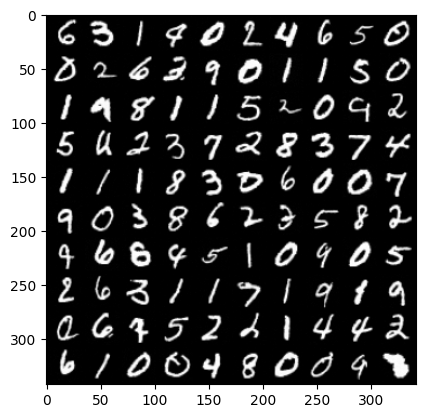

Accuracy:  0.14999999105930328


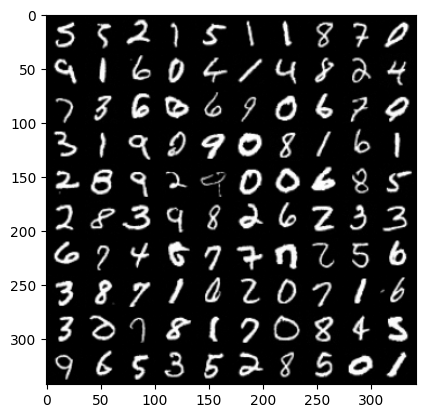

Accuracy:  0.10999999940395355


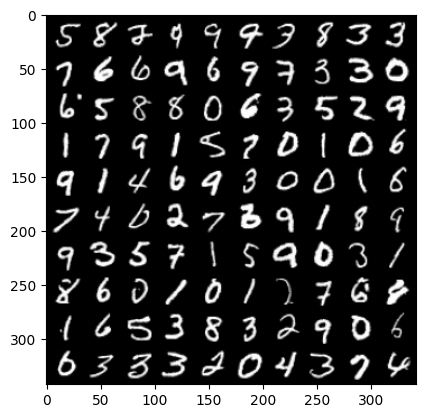

Accuracy:  0.1599999964237213


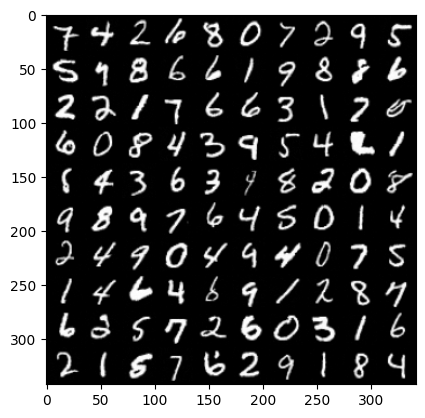

Accuracy:  0.12999999523162842


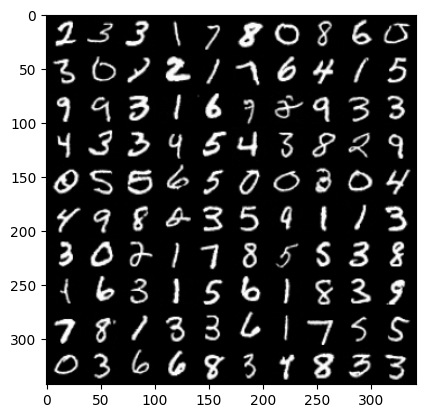

Accuracy:  0.10999999940395355


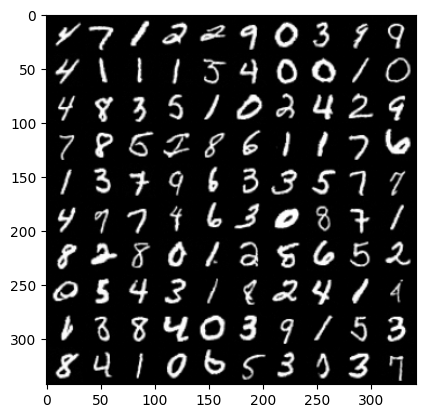

Accuracy:  0.07000000029802322


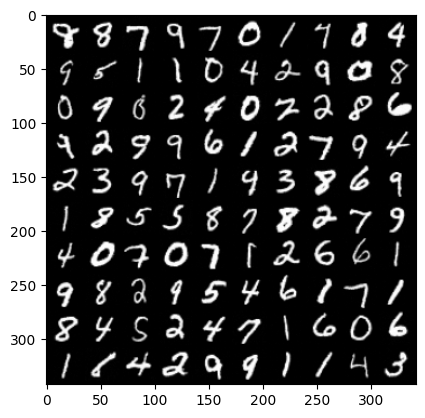

Accuracy:  0.10999999940395355


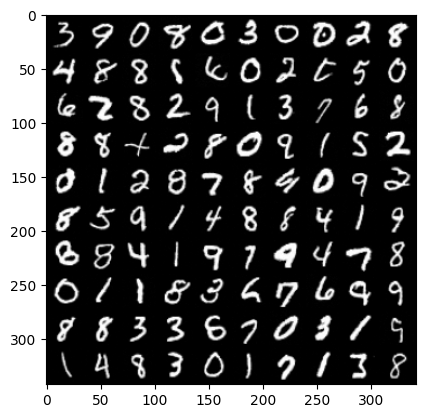

Accuracy:  0.2199999988079071


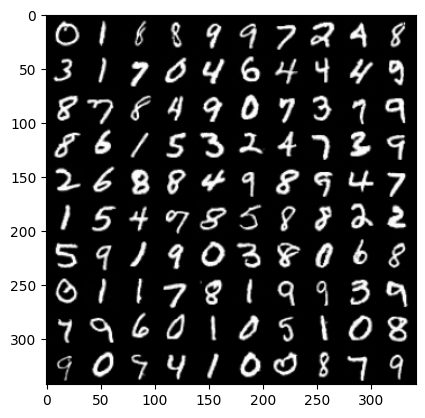

Accuracy:  0.17999999225139618
noisy_classifier T = 1


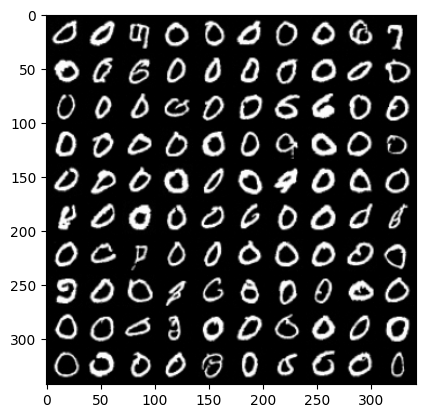

Accuracy:  0.8499999642372131


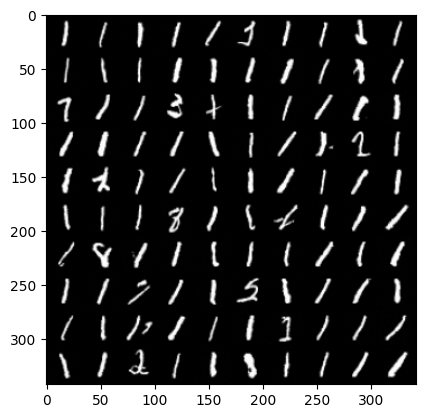

Accuracy:  0.85999995470047


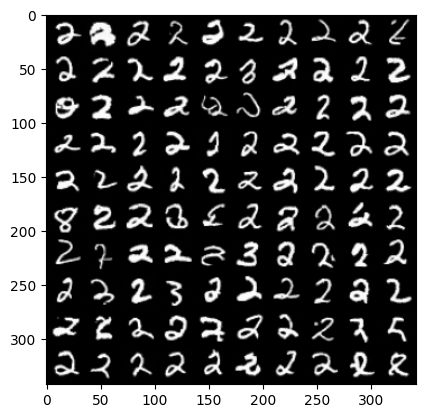

Accuracy:  0.8999999761581421


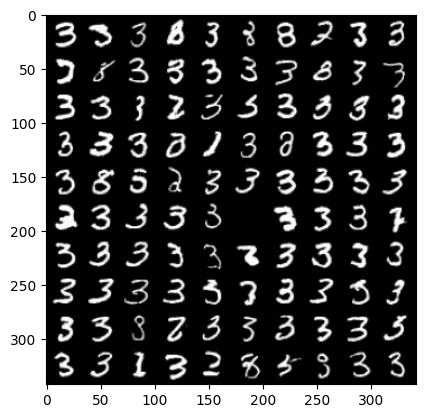

Accuracy:  0.7699999809265137


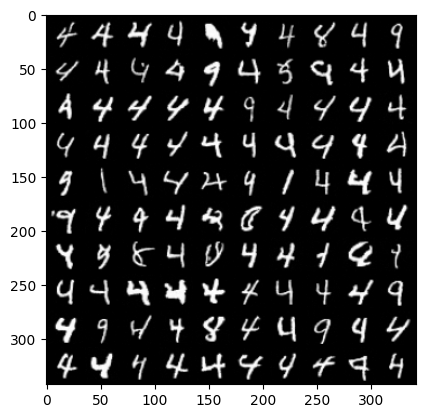

Accuracy:  0.7799999713897705


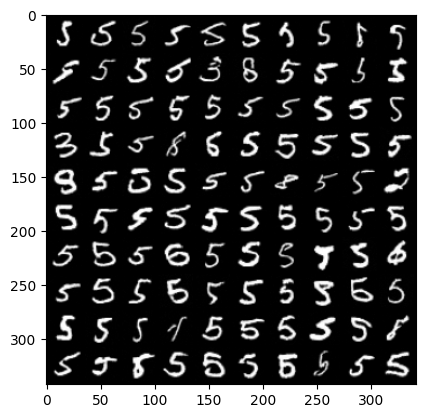

Accuracy:  0.8399999737739563


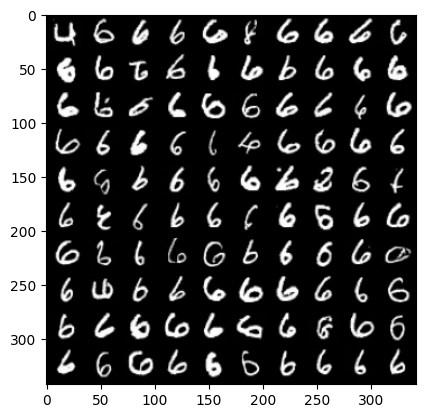

Accuracy:  0.9399999976158142


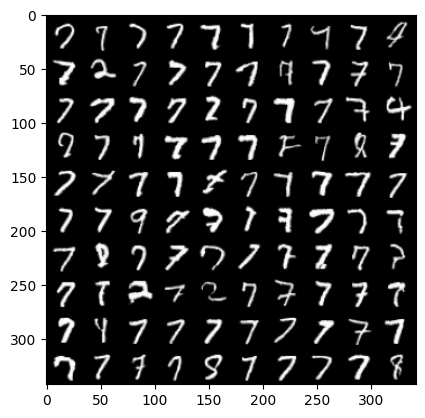

Accuracy:  0.8399999737739563


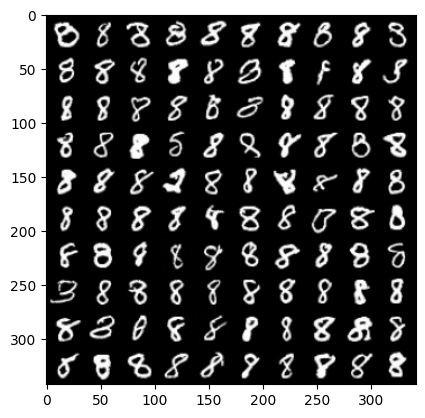

Accuracy:  0.9099999666213989


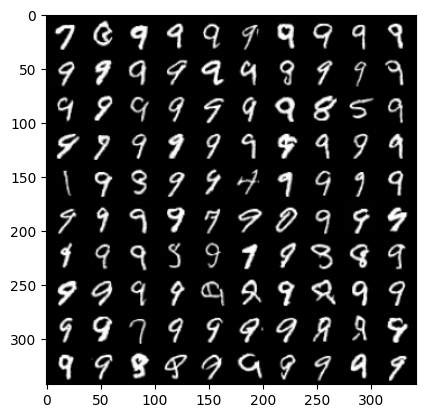

Accuracy:  0.7999999523162842
noisy_classifier T = 0.1


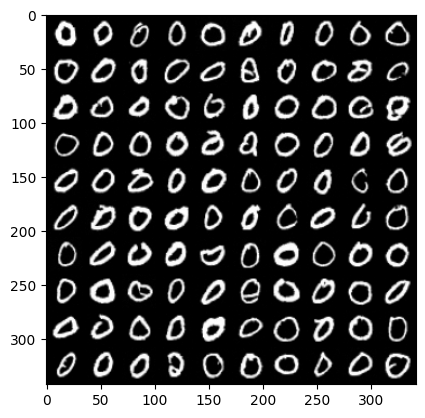

Accuracy:  0.9399999976158142


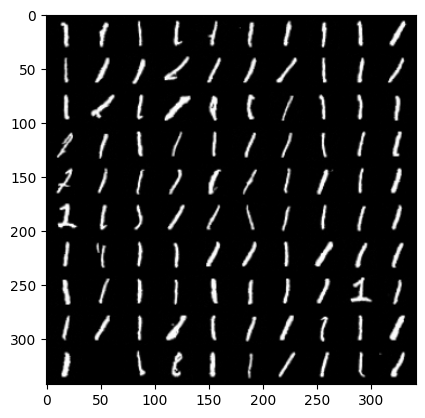

Accuracy:  0.9599999785423279


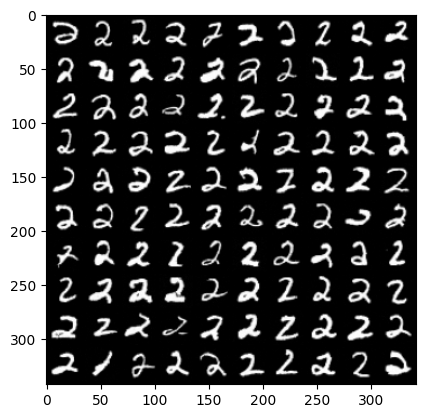

Accuracy:  0.9899999499320984


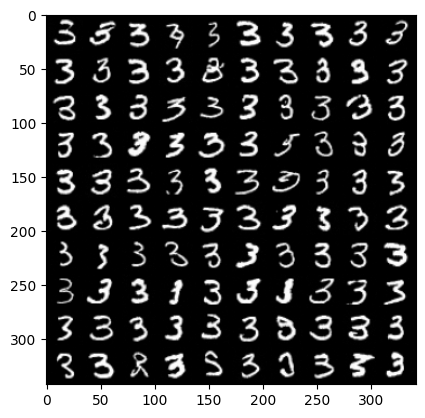

Accuracy:  0.9399999976158142


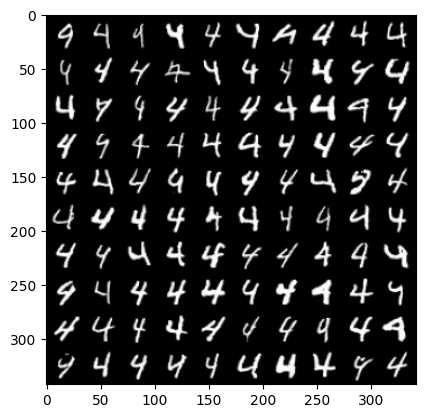

Accuracy:  0.9300000071525574


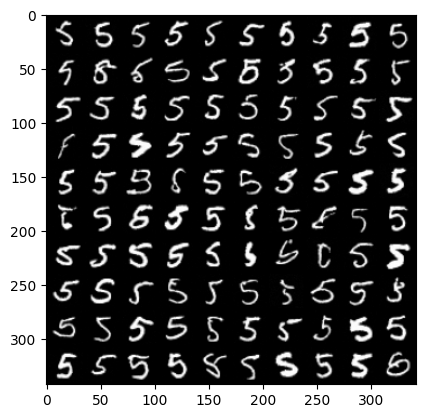

Accuracy:  0.9099999666213989


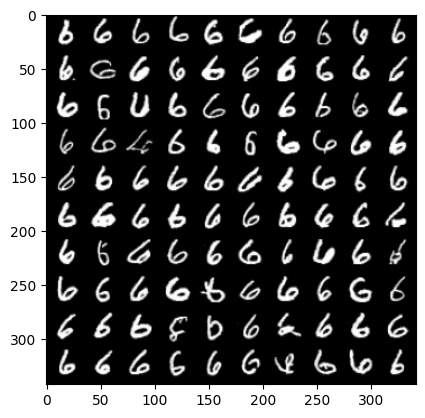

Accuracy:  0.9599999785423279


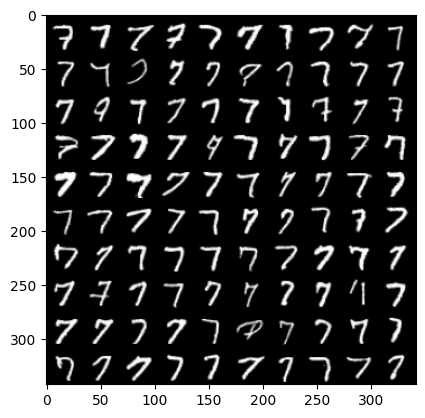

Accuracy:  0.9599999785423279


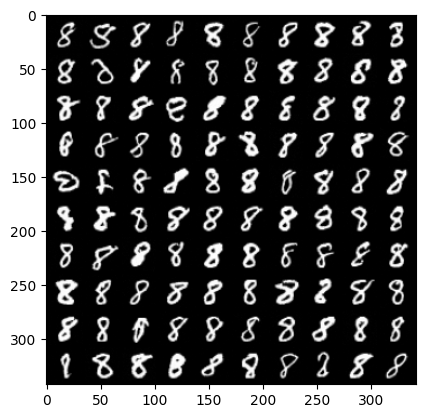

Accuracy:  0.9699999690055847


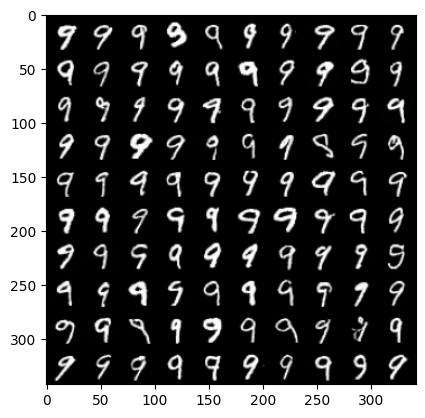

Accuracy:  0.9799999594688416
noisy_classifier T = 0.01


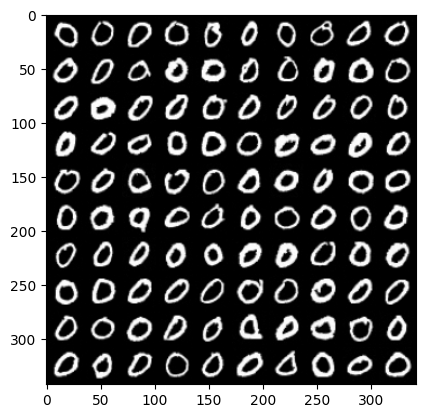

Accuracy:  0.9899999499320984


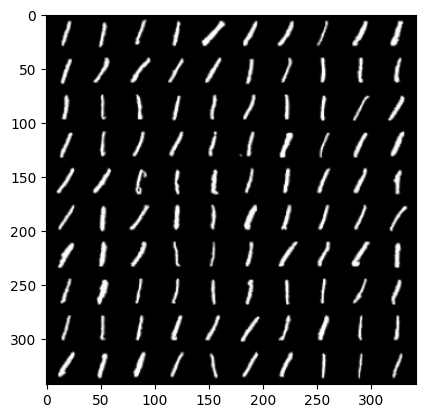

Accuracy:  1.0


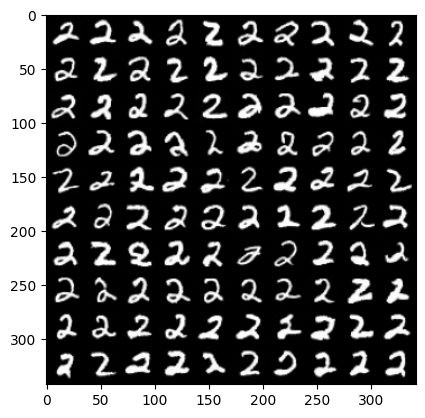

Accuracy:  0.9899999499320984


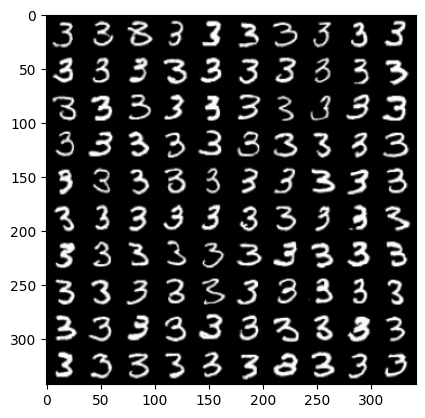

Accuracy:  0.9799999594688416


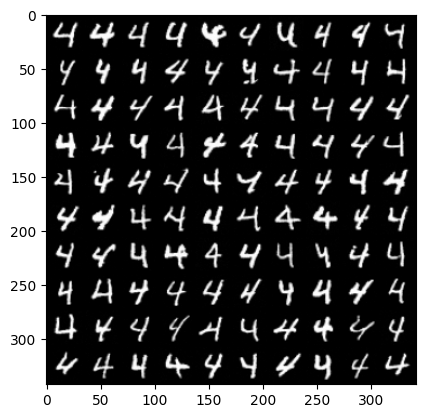

Accuracy:  0.9899999499320984


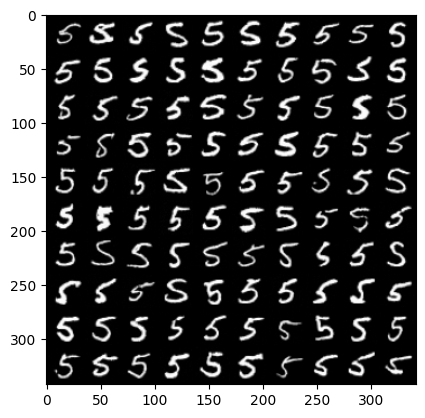

Accuracy:  0.9899999499320984


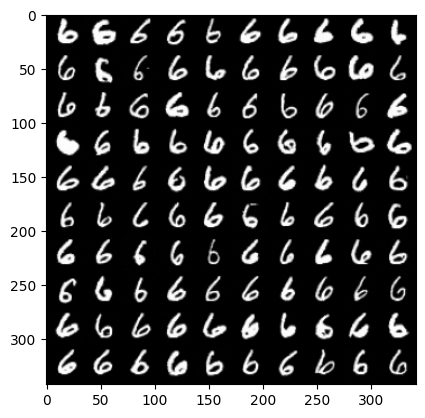

Accuracy:  1.0


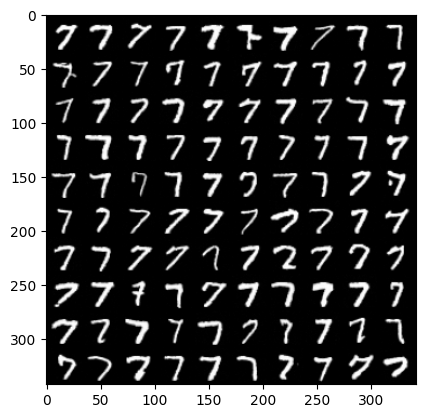

Accuracy:  0.9799999594688416


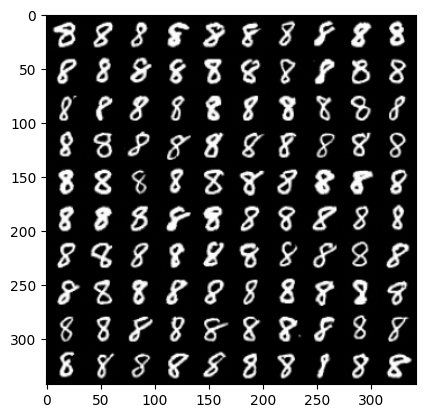

Accuracy:  1.0


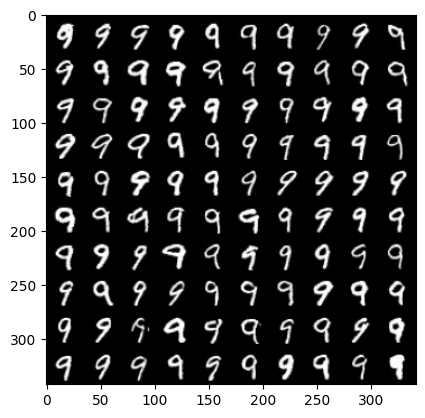

Accuracy:  1.0


In [22]:
ts = [10, 1, 0.1, 0.01]
for T in ts:
  conditional_diffusion.set_classifier(noisy_classifier, T=T)
  conditional_diffusion.model.eval()
  print(f"noisy_classifier T = {T}")
  for i in range(10):
    cond_print_and_calc_acc(i);
    


clean_classifier T = 10


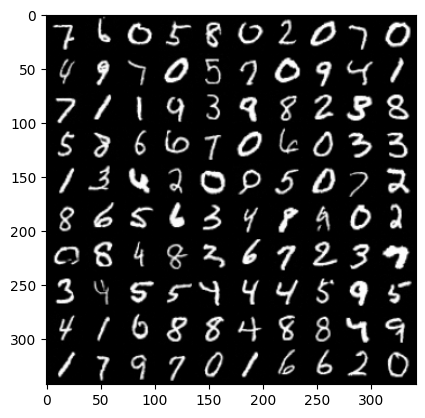

Accuracy:  0.14999999105930328


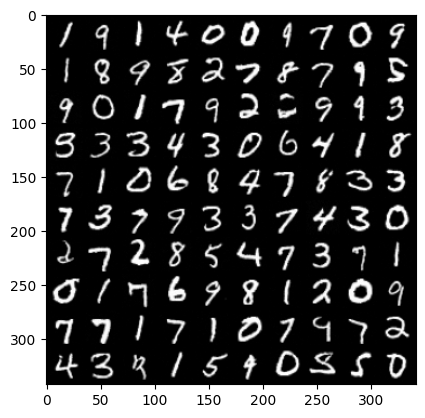

Accuracy:  0.11999999731779099


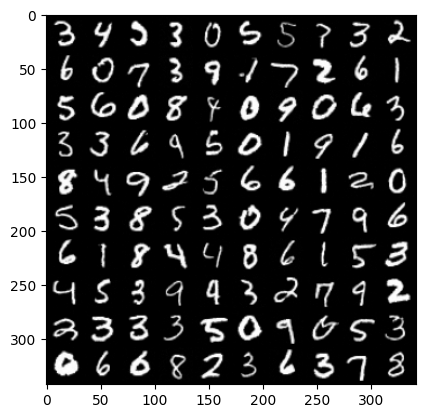

Accuracy:  0.07999999821186066


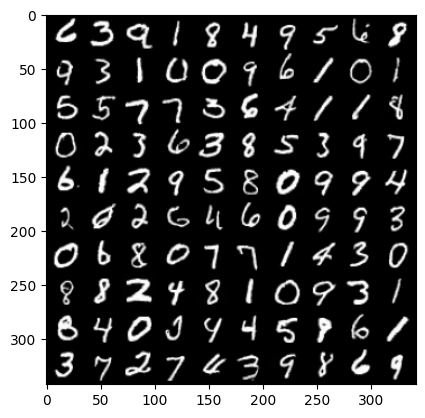

Accuracy:  0.10999999940395355


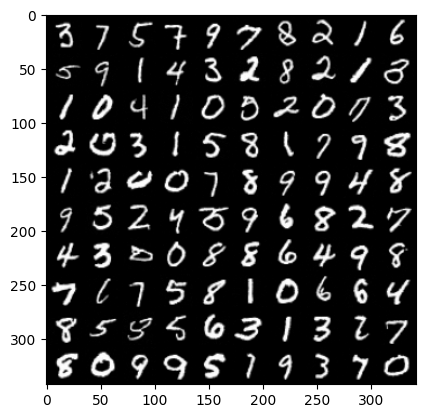

Accuracy:  0.07000000029802322


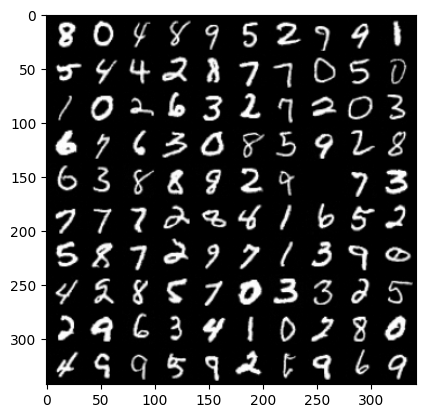

Accuracy:  0.09999999403953552


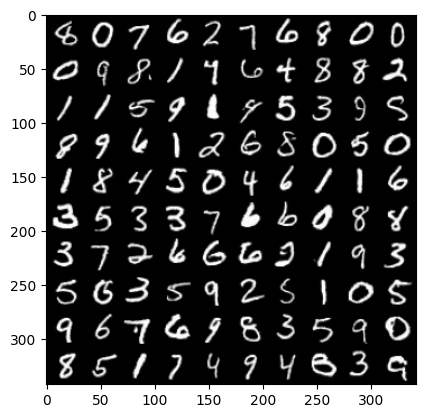

Accuracy:  0.14999999105930328


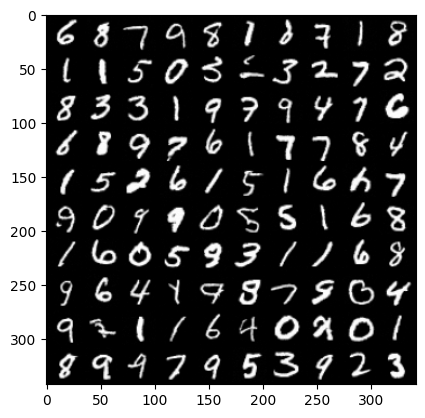

Accuracy:  0.10999999940395355


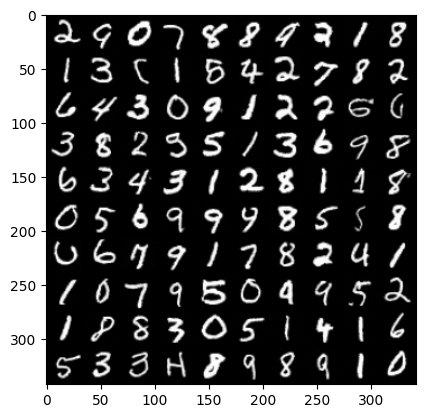

Accuracy:  0.1599999964237213


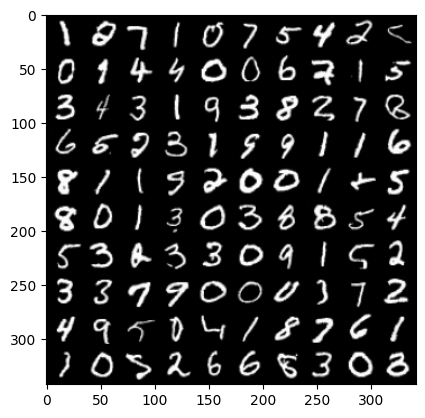

Accuracy:  0.07999999821186066
clean_classifier T = 1


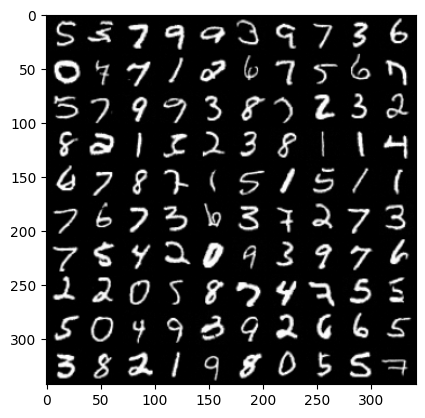

Accuracy:  0.04999999701976776


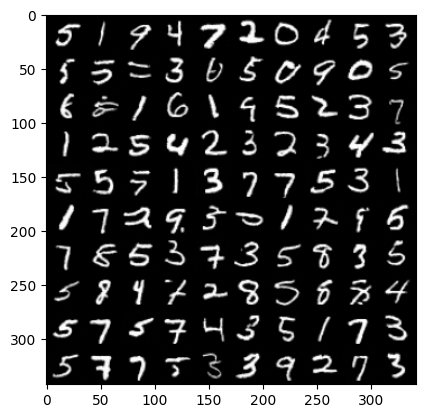

Accuracy:  0.08999999612569809


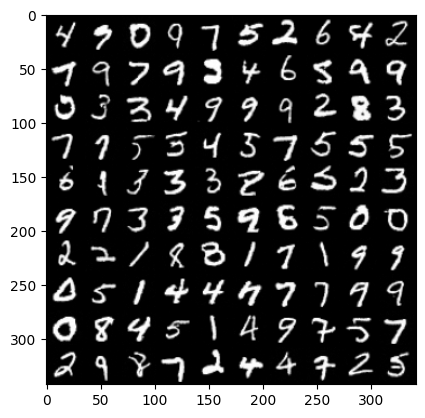

Accuracy:  0.09999999403953552


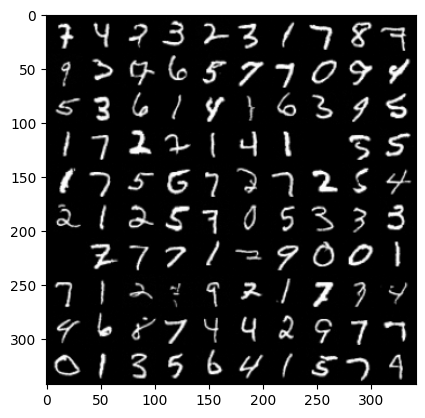

Accuracy:  0.08999999612569809


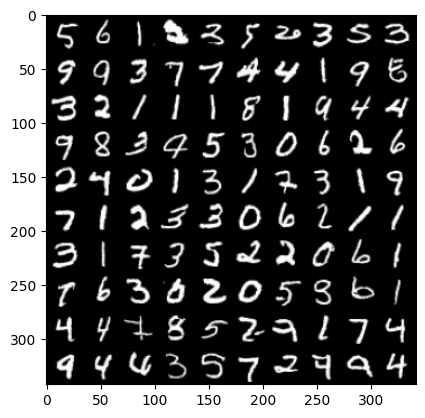

Accuracy:  0.10999999940395355


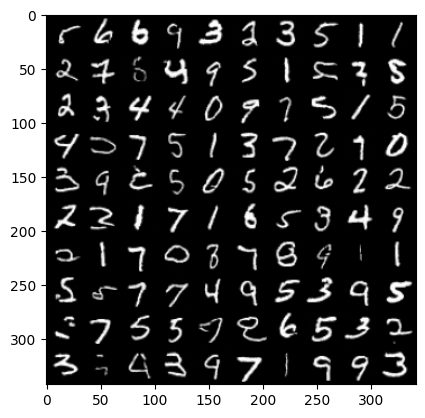

Accuracy:  0.22999998927116394


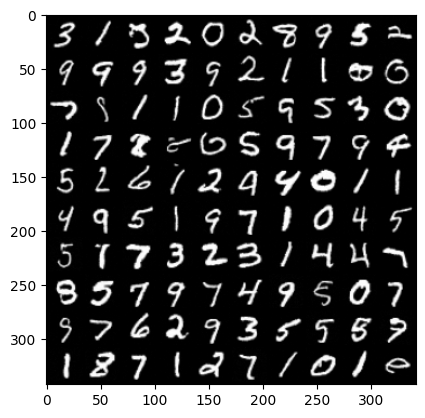

Accuracy:  0.029999999329447746


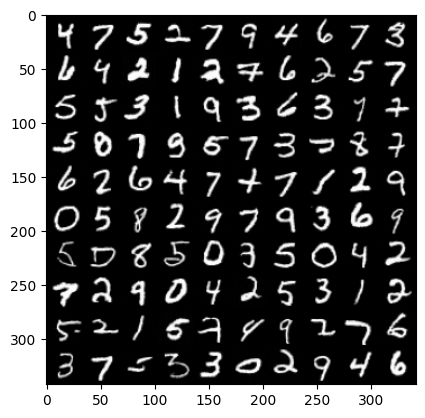

Accuracy:  0.14999999105930328


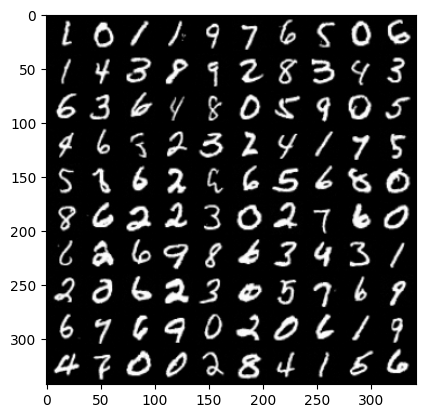

Accuracy:  0.07999999821186066


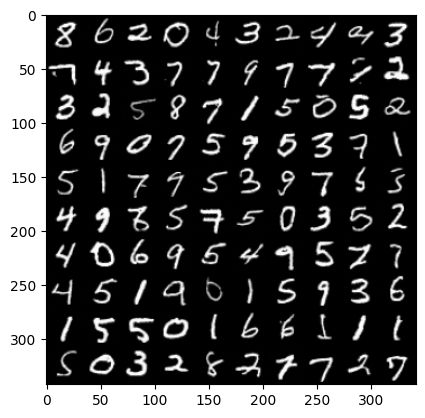

Accuracy:  0.10999999940395355
clean_classifier T = 0.1


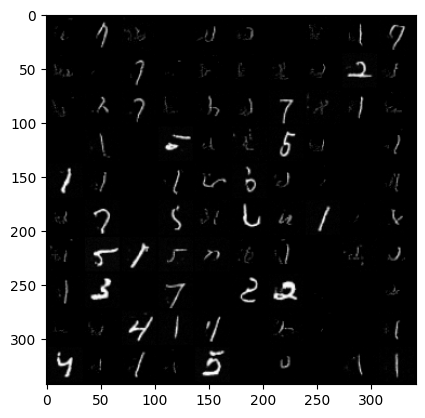

Accuracy:  0.019999999552965164


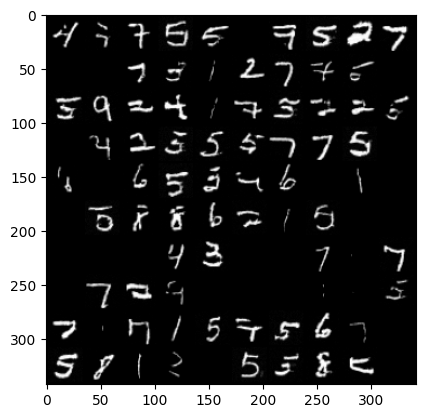

Accuracy:  0.3499999940395355


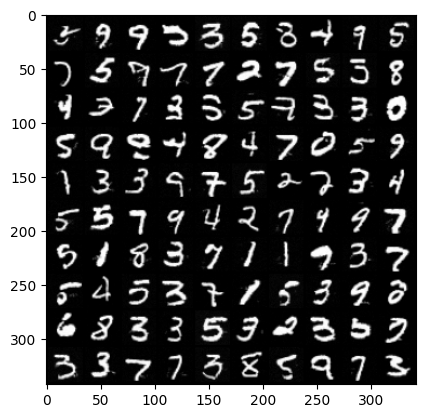

Accuracy:  0.07000000029802322


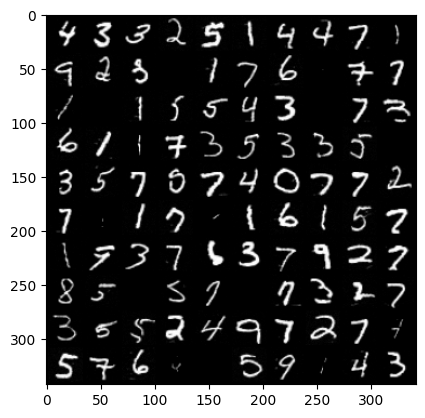

Accuracy:  0.14000000059604645


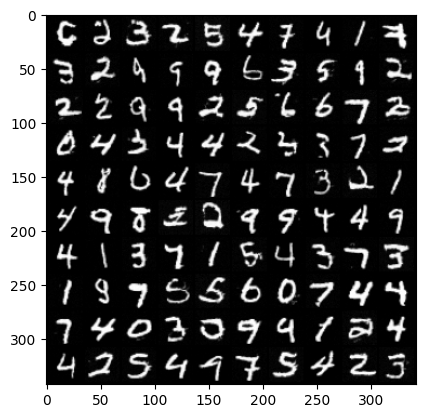

Accuracy:  0.2199999988079071


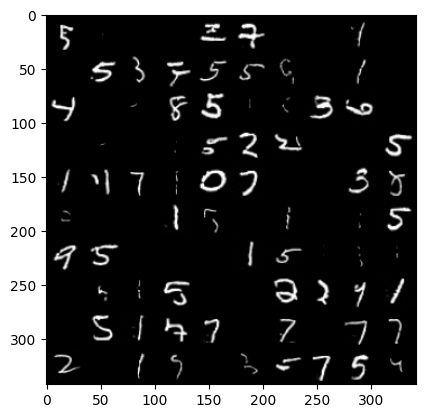

Accuracy:  0.1899999976158142


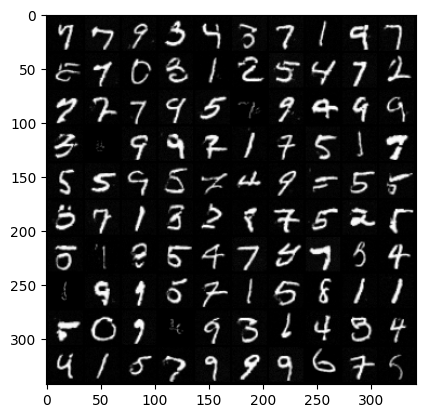

Accuracy:  0.019999999552965164


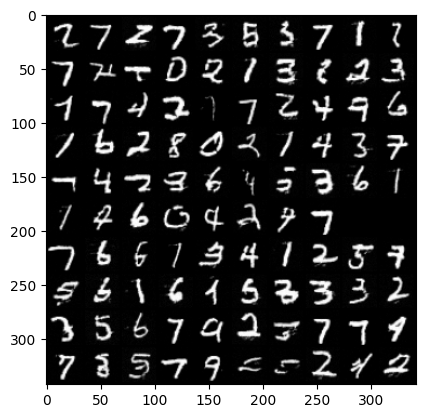

Accuracy:  0.17000000178813934


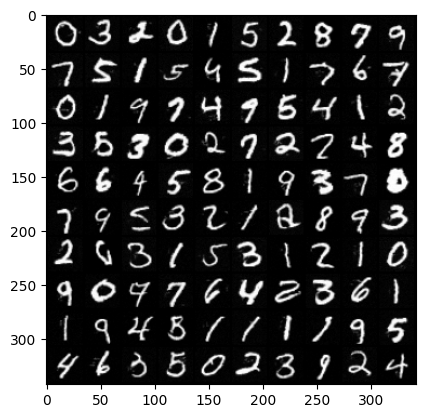

Accuracy:  0.03999999910593033


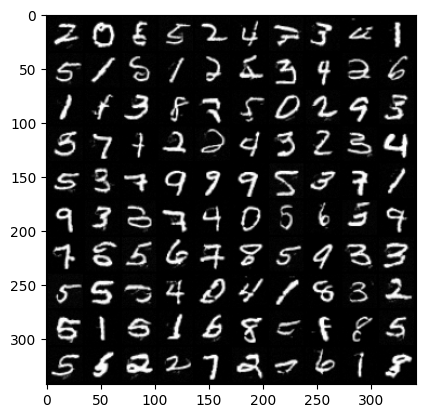

Accuracy:  0.07999999821186066
clean_classifier T = 0.01


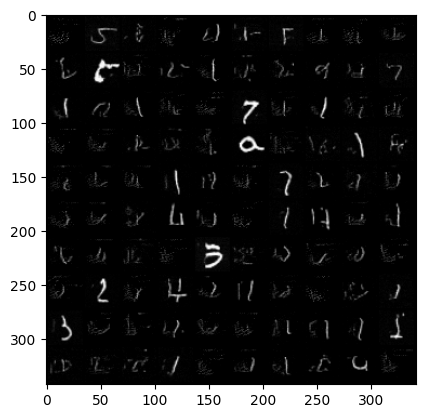

Accuracy:  0.3700000047683716


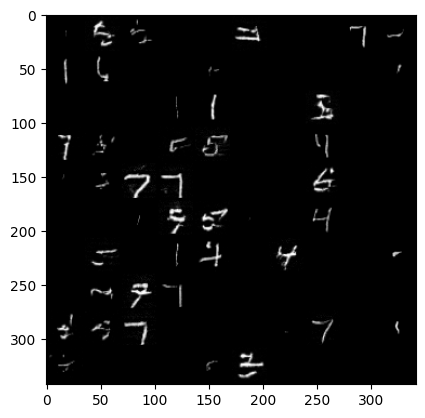

Accuracy:  0.7299999594688416


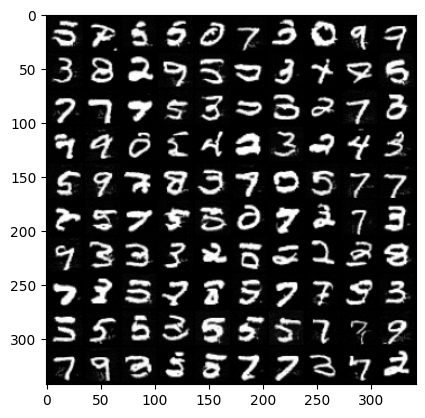

Accuracy:  0.20999999344348907


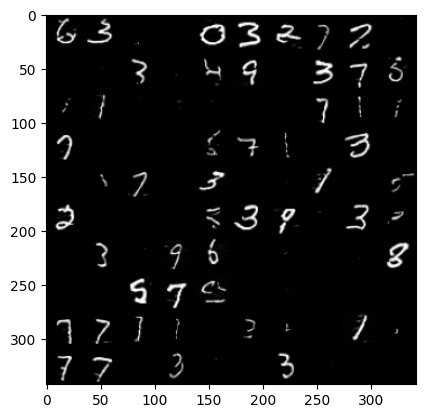

Accuracy:  0.14999999105930328


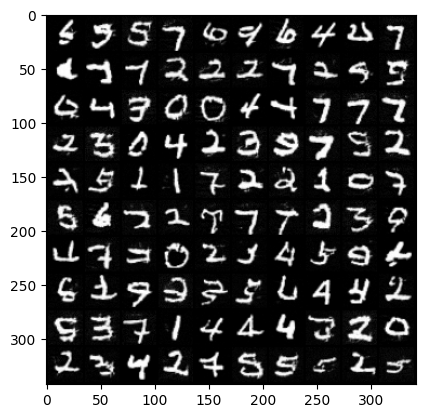

Accuracy:  0.20999999344348907


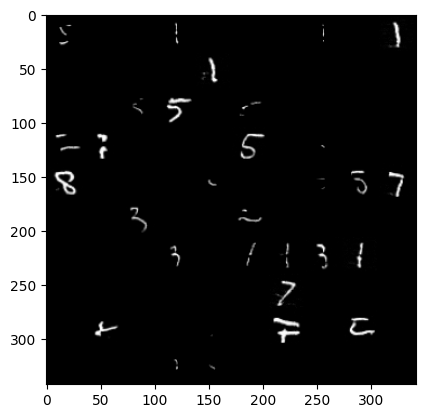

Accuracy:  0.08999999612569809


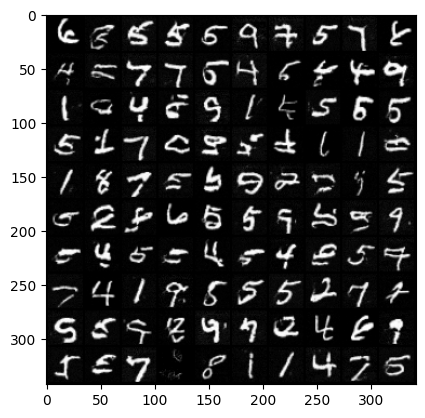

Accuracy:  0.22999998927116394


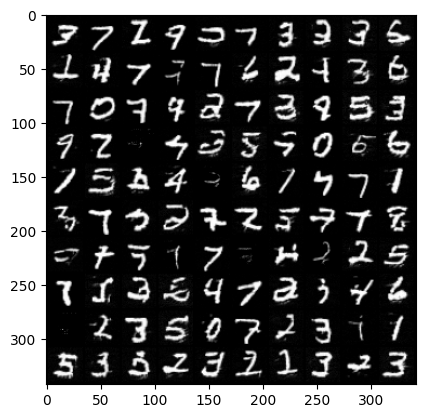

Accuracy:  0.2800000011920929


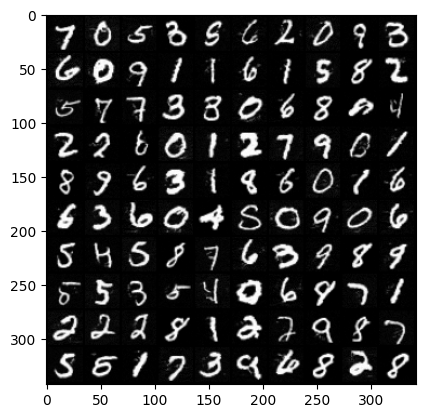

Accuracy:  0.28999999165534973


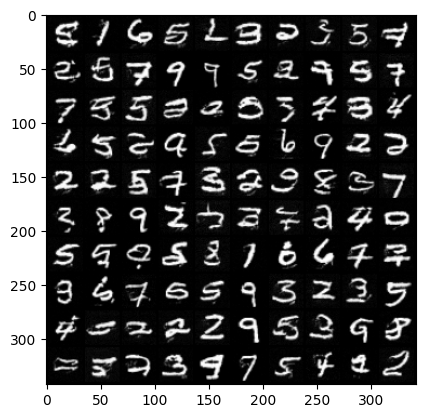

Accuracy:  0.2800000011920929


In [9]:
ts = [10, 1, 0.1, 0.01]
for T in ts:
  conditional_diffusion.set_classifier(clean_classifier, T=T)
  conditional_diffusion.model.eval()
  print(f"clean_classifier T = {T}")
  for i in range(10):
    cond_print_and_calc_acc(i);
  

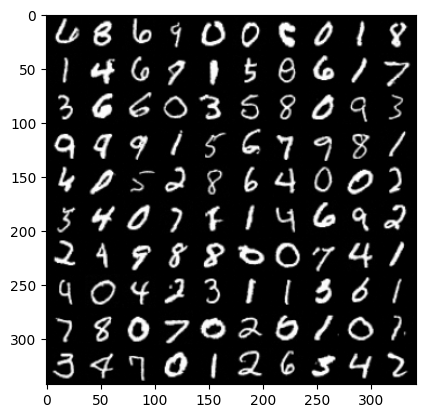

In [10]:
images_tensor = sample_images(unconditional_diffusion)
pred = get_pred_labels((images_tensor - 127.5)/ 127.5)

In [17]:
my_labels_view = torch.tensor(np.array([
    6, 8, 6, 9, 0, 0, 6, 0, 1, 8, 1, 4, 6, 9, 1, 5, 8, 6, 1, 7,
    3, 6, 6, 0, 3, 5, 8, 0, 9, 3, 9, 9, 9, 1, 5, 6, 7, 9, 8, 1, 4, 0, 5, 2, 8, 6, 4, 0, 0, 2, 
    3, 4, 0, 7, 7, 1, 4, 6, 9, 2, 2, 4, 9, 8, 8, 0, 0, 7, 4, 1, 4, 0, 4, 2, 3, 1, 1, 3, 6, 1,
    7, 8, 0, 7, 0, 2, 0, 1, 0, 7, 3, 4, 7, 0, 1, 2, 6, 3, 4, 2 
]))

In [25]:
((pred.cpu() == my_labels_view).sum()/my_labels_view.shape[0]).item()

0.9700000286102295

#### Посемплируйте наборы картинок всех классов обоими способами, изменить температуру можно с помощью повторного .set_classifier

> Как сильно влияет температура на отличимость семплов при условной генерации? Продеменстрируйте для разных T свои выводы.

Как видно из семплов выше, что пи увеличении температуры семплы становятся более одинаковыми и при большой температуре -- случайными числами.



> Какое качество получается у чистого классификатора при условной генерации? Попробуйте оценить на глаз качество чистого классификатора для безусловной генерации, объясните свои выводы.

Качество у чистого классификатора ужасное (даже чисто на вид) при любой температуре, ну это логично, потому что мы ж про шумные картинки вообще ничего не знаем. При этом качество чистого классификатора хорошее. Я сгенерировала картинки безусловной диффузией и чистым классификатором предсказала лейблы. После этого посмотрела на картинки глазами и поставила им цифру, а затем посчитала accuracy, получилосб 0.97, что хорошо.
